{'DoI': 0.16665476799435397, 'SHG Intensity': 19.864042043685913, 'Contrast': 4.568321924996946, 'Entropy': 6.5067900167097115, 'Orientation Histogram': array([0.05045871, 0.03639398, 0.03723546, 0.06891661, 0.07931216,
       0.0681407 , 0.09978633, 0.13191281, 0.20153703, 0.24101825,
       0.26659048, 0.32499133, 0.39279325, 0.50239866, 0.57047652,
       0.66435064, 0.78347734, 0.83053188, 3.37871427, 0.61652839,
       0.42823647, 0.3096398 , 0.24847135, 0.16978211, 0.13962273,
       0.12205275, 0.10853717, 0.14136579, 0.07332071, 0.05812491,
       0.03888017, 0.0586604 , 0.05429454, 0.02853653, 0.03115386,
       0.10291183]), 'Bins': array([-1.57079633, -1.48352986, -1.3962634 , -1.30899694, -1.22173048,
       -1.13446401, -1.04719755, -0.95993109, -0.87266463, -0.78539816,
       -0.6981317 , -0.61086524, -0.52359878, -0.43633231, -0.34906585,
       -0.26179939, -0.17453293, -0.08726646,  0.        ,  0.08726646,
        0.17453293,  0.26179939,  0.34906585,  0.43633231,  0

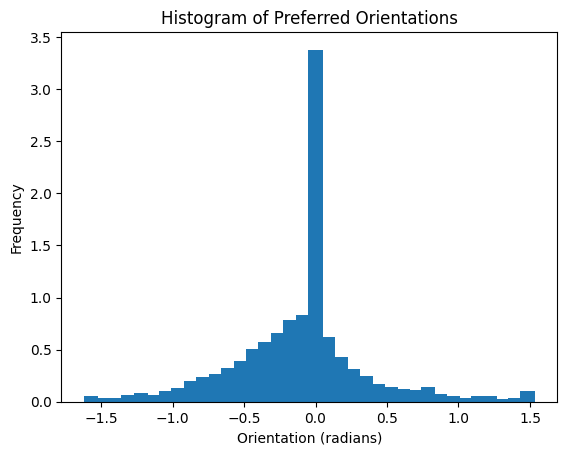

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.filters import sobel
from skimage.feature import graycomatrix, graycoprops
from scipy.ndimage import gaussian_filter

def load_image(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    return img

def compute_orientation_tensor(image):
    """Calculate the structure tensor and orientation map."""
    sobel_x = sobel(image, axis=0)
    sobel_y = sobel(image, axis=1)
    
    J11 = gaussian_filter(sobel_x * sobel_x, sigma=1)
    J22 = gaussian_filter(sobel_y * sobel_y, sigma=1)
    J12 = gaussian_filter(sobel_x * sobel_y, sigma=1)
    
    theta = 0.5 * np.arctan2(2 * J12, (J11 - J22))
    return theta

def histogram_of_orientations(theta):
    """Compute histogram of preferred orientations."""
    angles = theta.flatten()
    hist, bins = np.histogram(angles, bins=36, range=(-np.pi/2, np.pi/2), density=True)
    return hist, bins

def compute_doi(hist):
    """Compute the Degree of Isotropy (DoI)."""
    doi = np.std(hist) / np.max(hist) if np.max(hist) > 0 else 0
    return doi

def compute_shg_intensity(image):
    """Compute the mean intensity of SHG signal."""
    return np.mean(image)

def texture_analysis(image):
    """Compute texture features using GLCM (Grey-Level Co-Occurrence Matrix)."""
    glcm = graycomatrix(image, distances=[1], angles=[0], levels=256, symmetric=True, normed=True)
    contrast = graycoprops(glcm, 'contrast')[0, 0]
    entropy = -np.sum(glcm * np.log2(glcm + 1e-10))
    return contrast, entropy

def process_shg_image(image_path):
    """Process an SHG image and extract features."""
    img = load_image(image_path)
    theta = compute_orientation_tensor(img)
    hist, bins = histogram_of_orientations(theta)
    doi = compute_doi(hist)
    shg_intensity = compute_shg_intensity(img)
    contrast, entropy = texture_analysis(img)
    
    results = {
        "DoI": doi,
        "SHG Intensity": shg_intensity,
        "Contrast": contrast,
        "Entropy": entropy,
        "Orientation Histogram": hist,
        "Bins": bins
    }
    return results

# Example usage
image_path = "C:\\Users\\danwo\\Desktop\\ZS0001_TI_25XW_Rhodopsin_Au\\IVM4101#_TI_25XW_Rhodopsin_Au.png" 
results = process_shg_image(image_path)
print(results)

# Plot orientation histogram
plt.bar(results["Bins"][:-1], results["Orientation Histogram"], width=0.1)
plt.xlabel("Orientation (radians)")
plt.ylabel("Frequency")
plt.title("Histogram of Preferred Orientations")
plt.show()

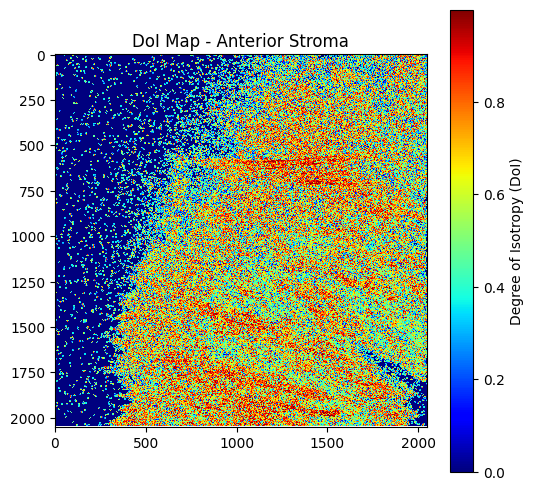

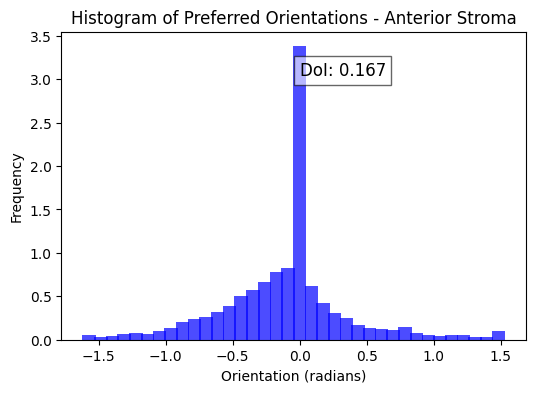

{'DoI': 0.16665476799435397, 'SHG Intensity': 19.864042043685913, 'Contrast': 4.568321924996946, 'Entropy': 6.5067900167097115, 'Orientation Histogram': array([0.05045871, 0.03639398, 0.03723546, 0.06891661, 0.07931216,
       0.0681407 , 0.09978633, 0.13191281, 0.20153703, 0.24101825,
       0.26659048, 0.32499133, 0.39279325, 0.50239866, 0.57047652,
       0.66435064, 0.78347734, 0.83053188, 3.37871427, 0.61652839,
       0.42823647, 0.3096398 , 0.24847135, 0.16978211, 0.13962273,
       0.12205275, 0.10853717, 0.14136579, 0.07332071, 0.05812491,
       0.03888017, 0.0586604 , 0.05429454, 0.02853653, 0.03115386,
       0.10291183]), 'Bins': array([-1.57079633, -1.48352986, -1.3962634 , -1.30899694, -1.22173048,
       -1.13446401, -1.04719755, -0.95993109, -0.87266463, -0.78539816,
       -0.6981317 , -0.61086524, -0.52359878, -0.43633231, -0.34906585,
       -0.26179939, -0.17453293, -0.08726646,  0.        ,  0.08726646,
        0.17453293,  0.26179939,  0.34906585,  0.43633231,  0

In [2]:
#Este es el mismo código pero con la adición de la función process_shg_image que incluye la visualización de la imagen DoI y el histograma de orientaciones preferidas.
#He puesto anterior stroma pero que en verdad no se cual es la región de la imagen que he puesto
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.filters import sobel
from skimage.feature import graycomatrix, graycoprops
from scipy.ndimage import gaussian_filter

def load_image(image_path):
    try:
        img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        if img is None:
            raise ValueError("Image not found or unable to load.")
        return img
    except Exception as e:
        print(f"Error loading image: {e}")
        return None

def compute_orientation_tensor(image):
    """Calculate the structure tensor and orientation map."""
    sobel_x = sobel(image, axis=0) # Compute the gradient along the x-axis
    sobel_y = sobel(image, axis=1)
    
    J11 = gaussian_filter(sobel_x * sobel_x, sigma=1)
    J22 = gaussian_filter(sobel_y * sobel_y, sigma=1)
    J12 = gaussian_filter(sobel_x * sobel_y, sigma=1)
    
    theta = 0.5 * np.arctan2(2 * J12, (J11 - J22))
    doi_map = np.sqrt(J12**2 + (J11 - J22)**2) / (J11 + J22 + 1e-10)  # Normalized DOI map
    return theta, doi_map

def histogram_of_orientations(theta):
    """Compute histogram of preferred orientations."""
    angles = theta.flatten()
    hist, bins = np.histogram(angles, bins=36, range=(-np.pi/2, np.pi/2), density=True)
    return hist, bins

def compute_doi(hist):
    """Compute the Degree of Isotropy (DoI)."""
    doi = np.std(hist) / np.max(hist) if np.max(hist) > 0 else 0
    return doi

def compute_shg_intensity(image):
    """Compute the mean intensity of SHG signal."""
    return np.mean(image)

def texture_analysis(image):
    """Compute texture features using GLCM (Grey-Level Co-Occurrence Matrix)."""
    glcm = graycomatrix(image, distances=[1], angles=[0], levels=256, symmetric=True, normed=True)
    contrast = graycoprops(glcm, 'contrast')[0, 0]
    entropy = -np.sum(glcm * np.log2(glcm + 1e-10))
    return contrast, entropy

def process_shg_image(image_path, region_label="Region"): 
    """Process an SHG image and extract features."""
    img = load_image(image_path)
    if img is None:
        return None
    
    theta, doi_map = compute_orientation_tensor(img)
    hist, bins = histogram_of_orientations(theta)
    doi = compute_doi(hist)
    shg_intensity = compute_shg_intensity(img)
    contrast, entropy = texture_analysis(img)
    
    results = {
        "DoI": doi,
        "SHG Intensity": shg_intensity,
        "Contrast": contrast,
        "Entropy": entropy,
        "Orientation Histogram": hist,
        "Bins": bins,
        "DoI Map": doi_map
    }
    
    # Plot DoI map
    plt.figure(figsize=(6,6))
    plt.imshow(doi_map, cmap='jet', interpolation='nearest')
    plt.colorbar(label="Degree of Isotropy (DoI)")
    plt.title(f"DoI Map - {region_label}")
    plt.show()
    
    # Plot orientation histogram with DoI value
    plt.figure(figsize=(6,4))
    plt.bar(results["Bins"][:-1], results["Orientation Histogram"], width=0.1, color='b', alpha=0.7)
    plt.xlabel("Orientation (radians)")
    plt.ylabel("Frequency")
    plt.title(f"Histogram of Preferred Orientations - {region_label}")
    plt.text(0, max(hist)*0.9, f"DoI: {doi:.3f}", fontsize=12, bbox=dict(facecolor='white', alpha=0.6))
    plt.show()
    
    return results

# Example usage
image_path = "C:\\Users\\danwo\\Desktop\\ZS0001_TI_25XW_Rhodopsin_Au\\IVM4101#_TI_25XW_Rhodopsin_Au.png" 
region_label = "Anterior Stroma"  # Change region
results = process_shg_image(image_path, region_label)
if results:
    print(results)


Processing: IVM4101#_TI_25XW_Rhodopsin_Au.png


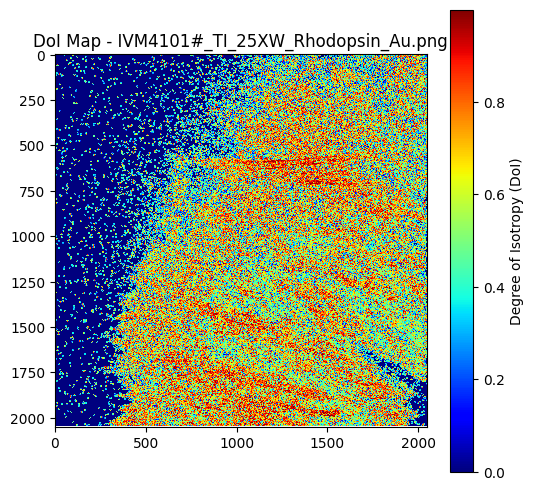

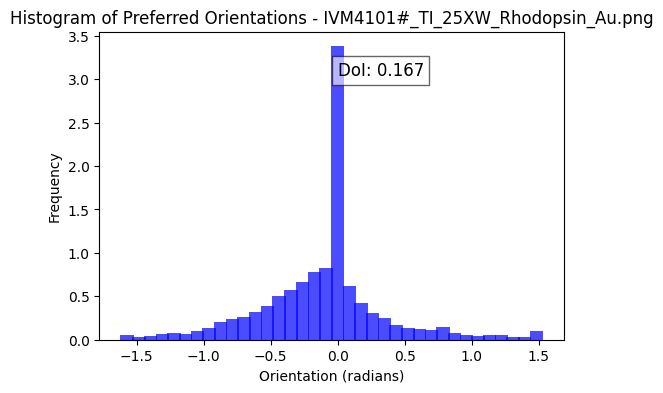


Processing: IVM4102#_TI_25XW_Rhodopsin_Au.png


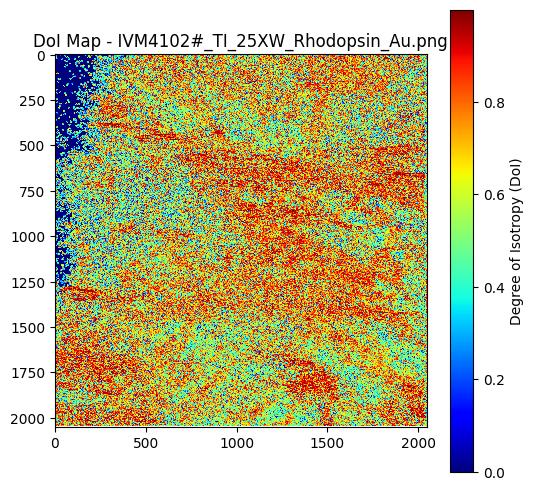

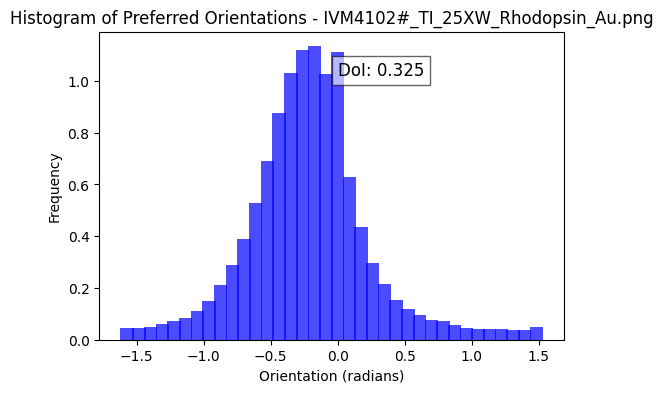


Processing: IVM4103#_TI_25XW_Rhodopsin_Au.png


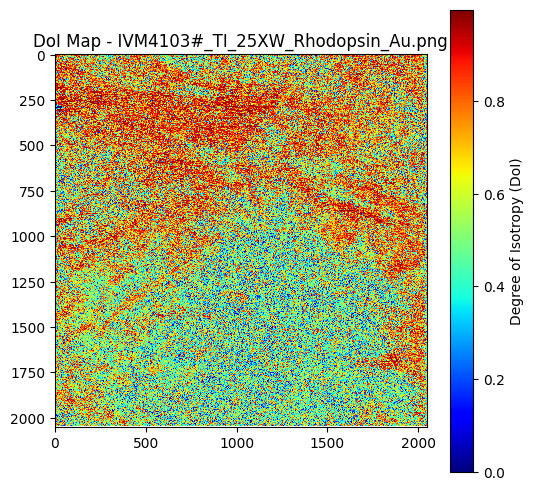

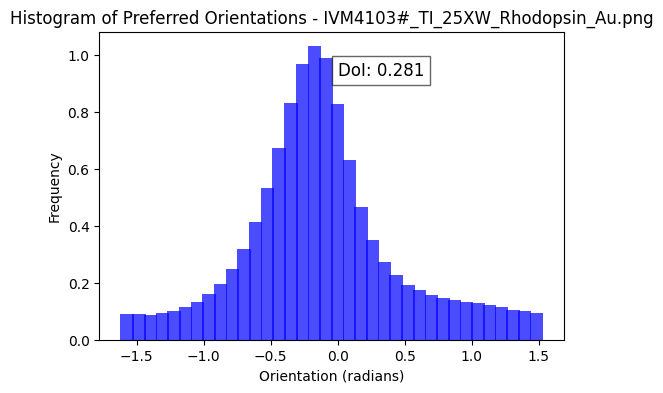


Processing: IVM4104#_TI_25XW_Rhodopsin_Au.png


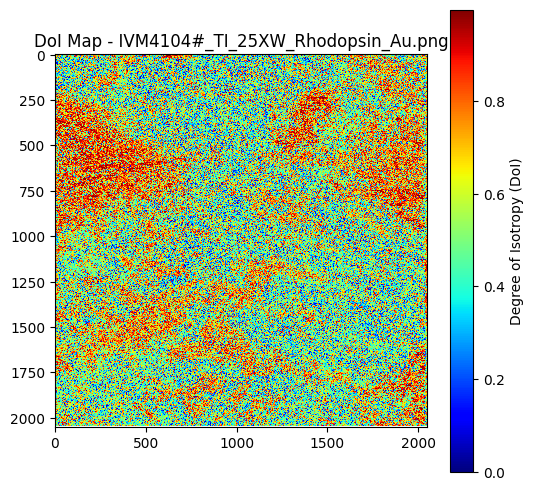

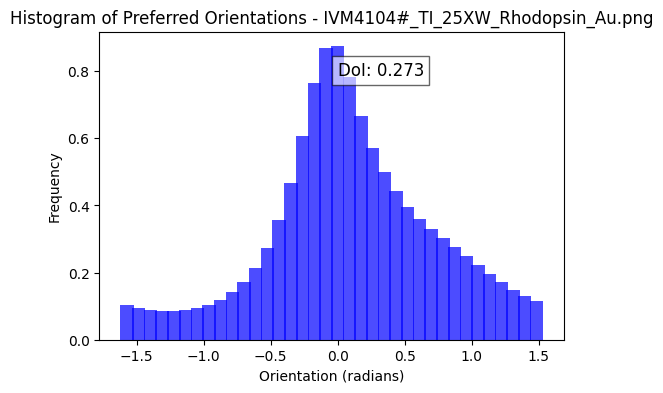


Processing: IVM4105#_TI_25XW_Rhodopsin_Au.png


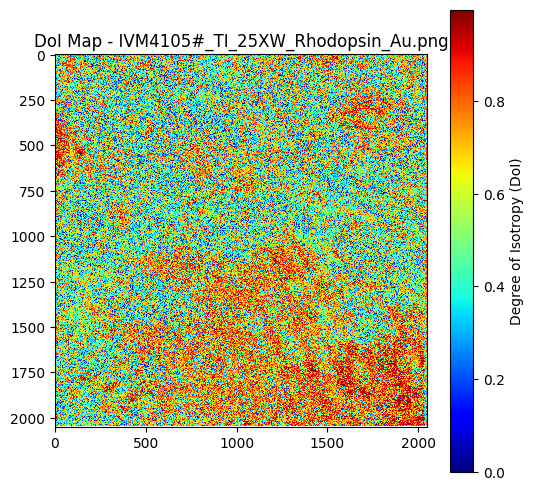

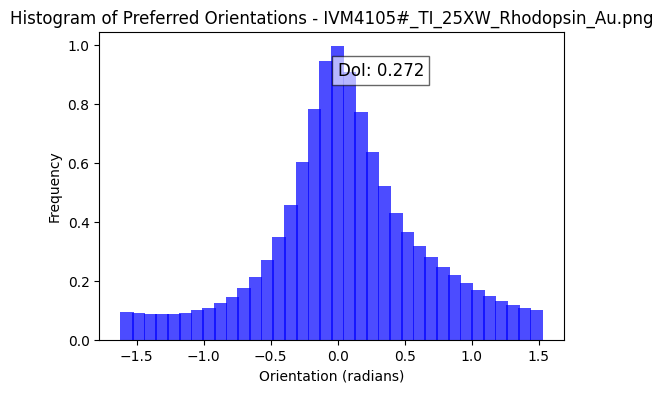


Processing: IVM4106#_TI_25XW_Rhodopsin_Au.png


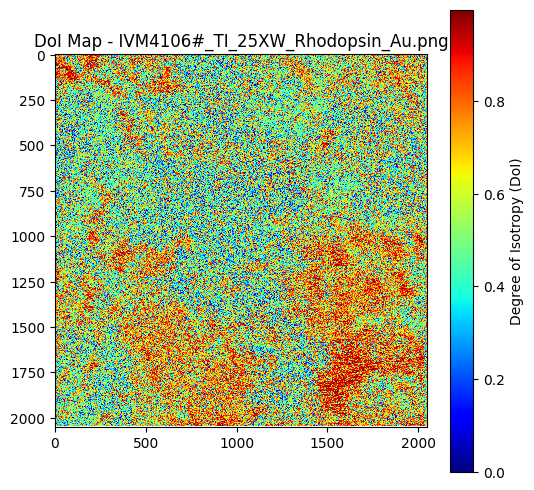

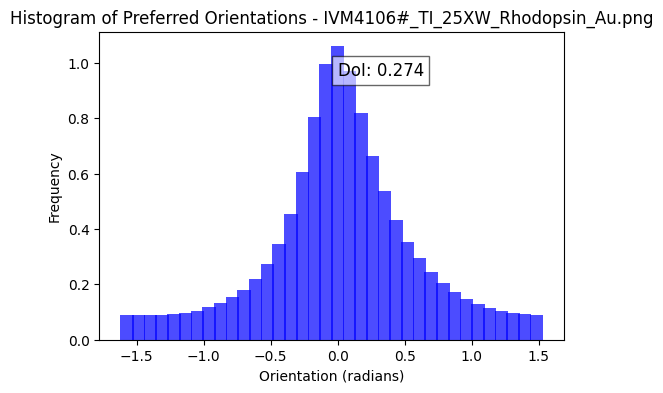


Processing: IVM4107#_TI_25XW_Rhodopsin_Au.png


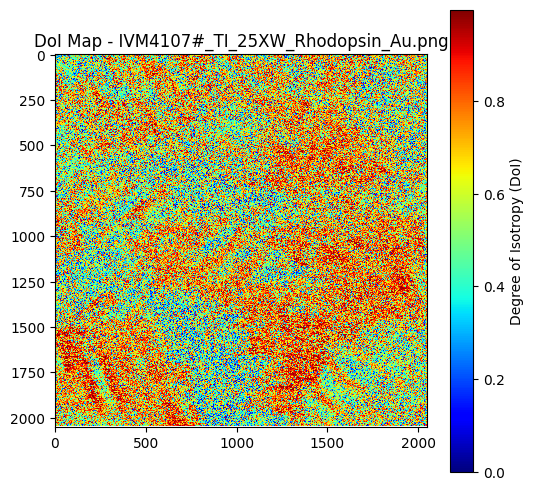

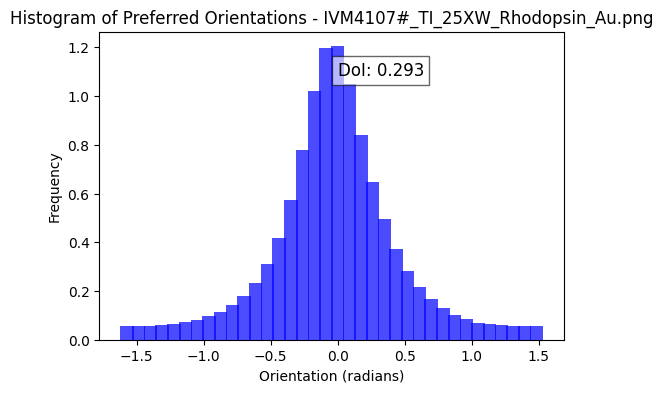


Processing: IVM4108#_TI_25XW_Rhodopsin_Au.png


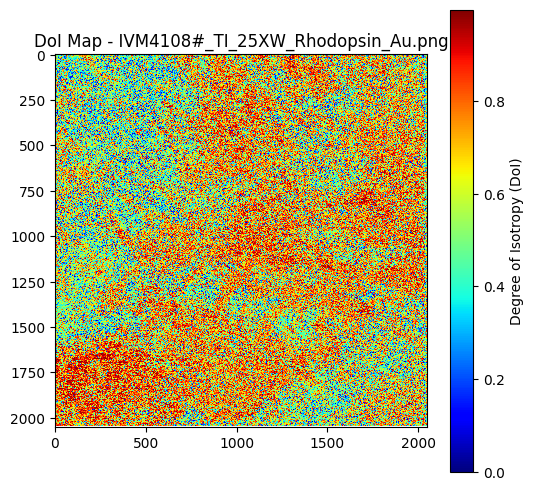

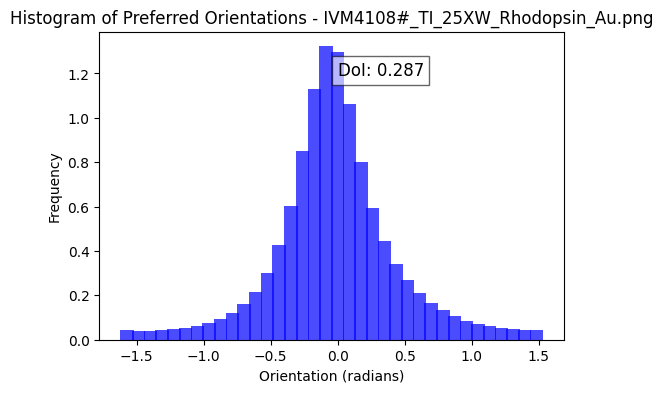


Processing: IVM4109#_TI_25XW_Rhodopsin_Au.png


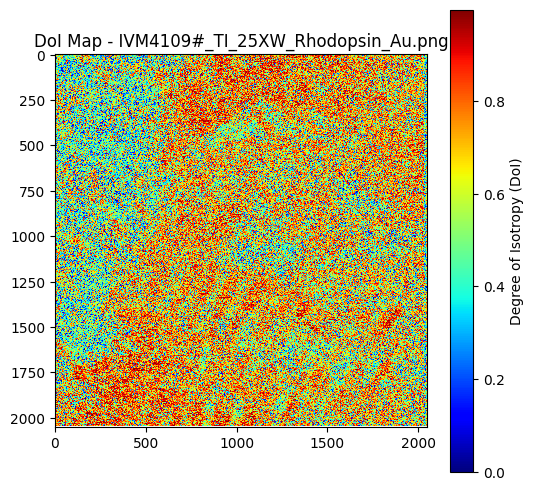

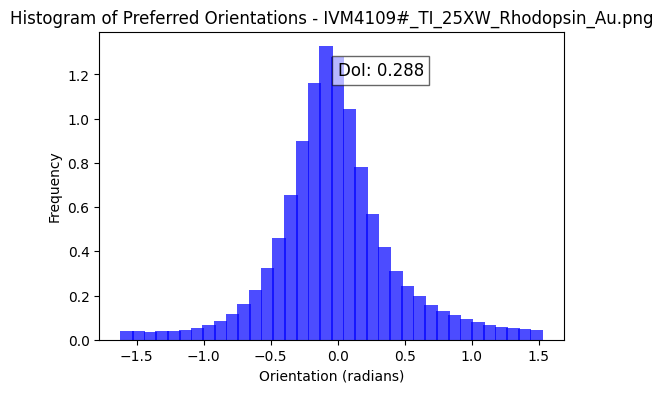


Processing: IVM4110#_TI_25XW_Rhodopsin_Au.png


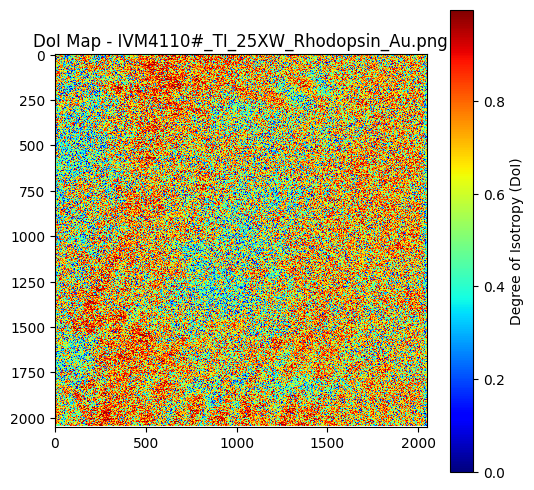

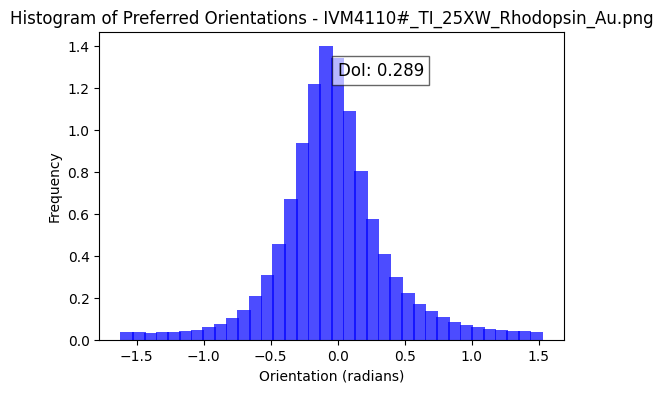


Processing: IVM4111#_TI_25XW_Rhodopsin_Au.png


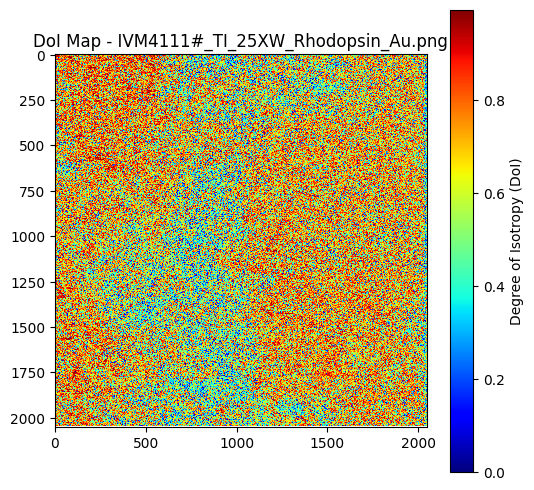

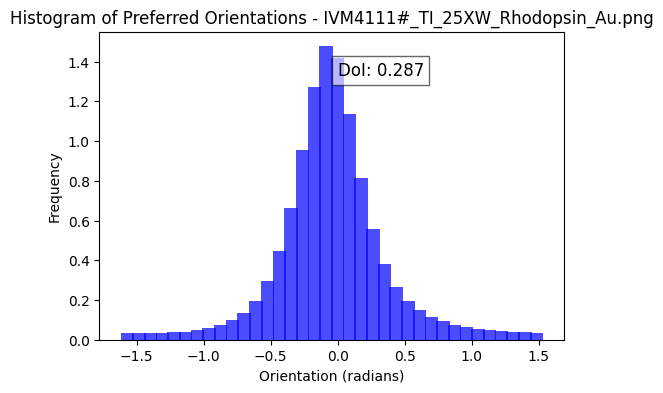


Processing: IVM4112#_TI_25XW_Rhodopsin_Au.png


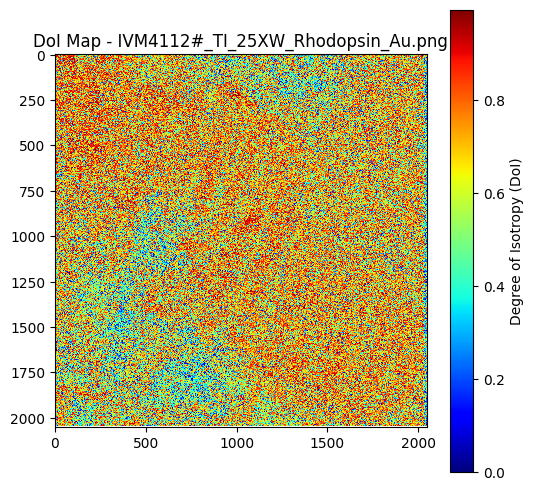

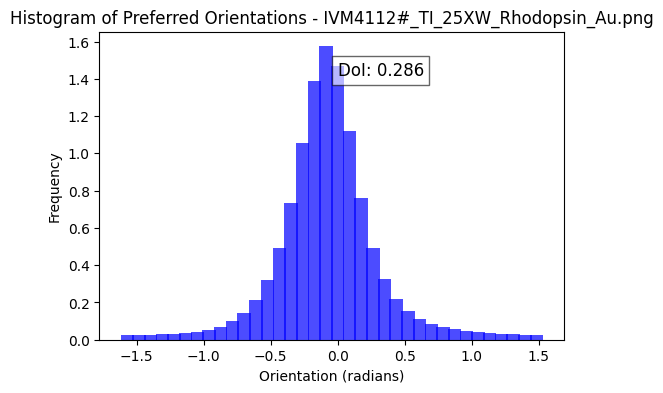


Processing: IVM4113#_TI_25XW_Rhodopsin_Au.png


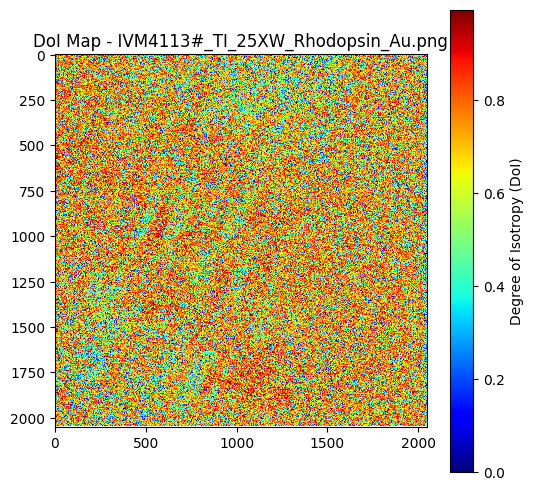

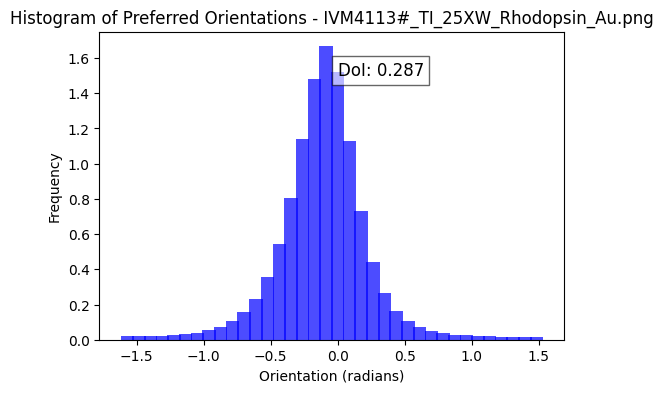


Processing: IVM4114#_TI_25XW_Rhodopsin_Au.png


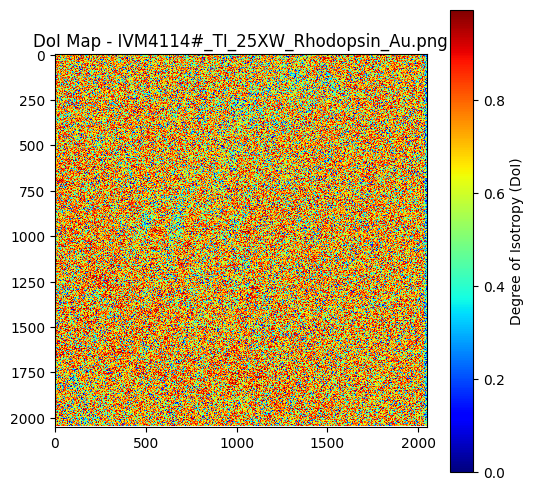

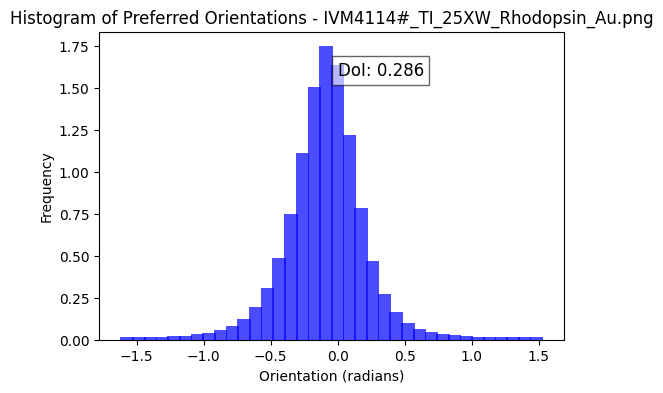


Processing: IVM4115#_TI_25XW_Rhodopsin_Au.png


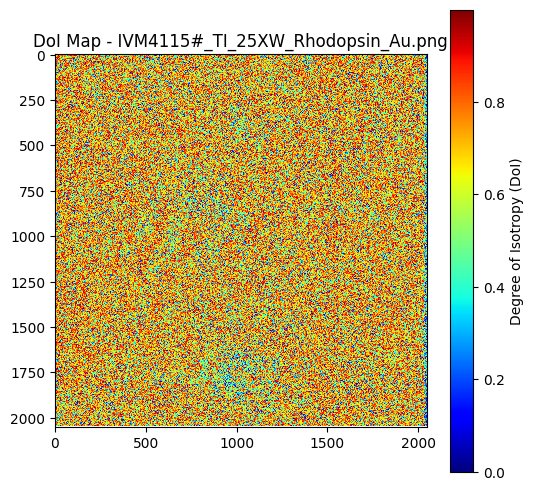

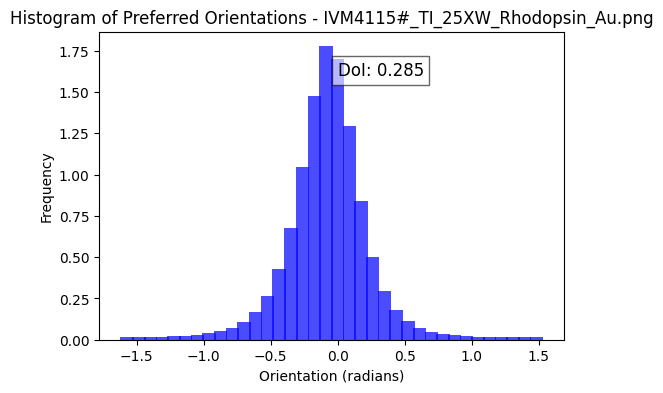


Processing: IVM4116#_TI_25XW_Rhodopsin_Au.png


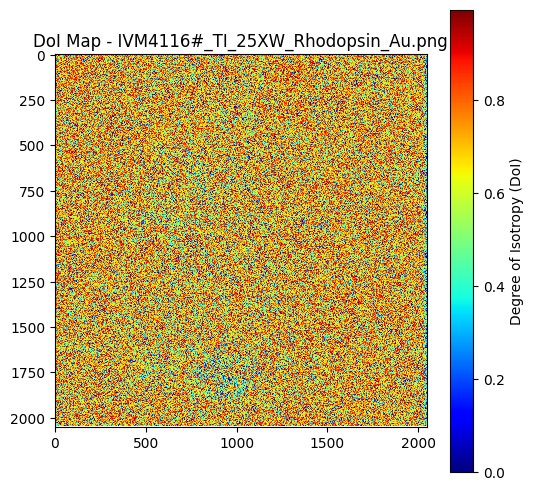

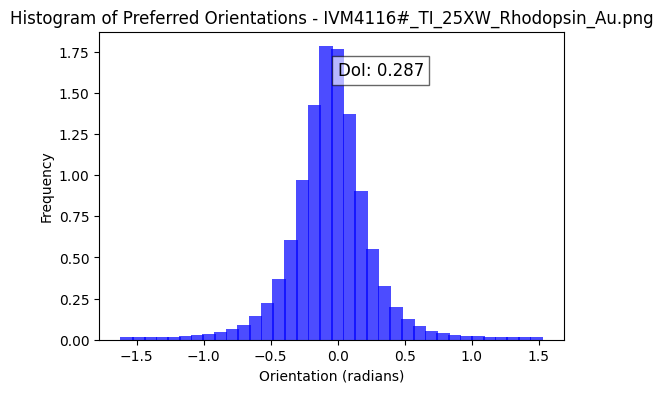


Processing: IVM4117#_TI_25XW_Rhodopsin_Au.png


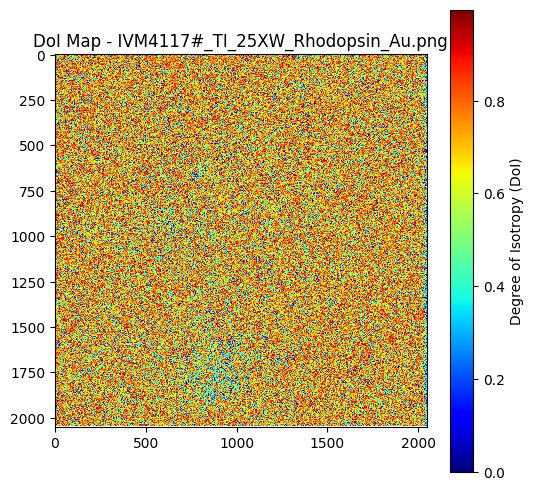

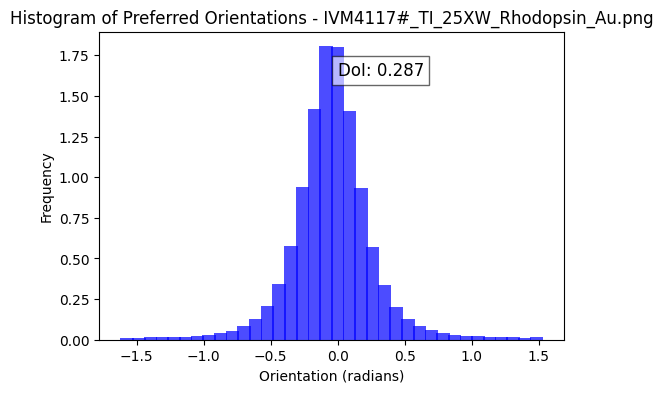


Processing: IVM4118#_TI_25XW_Rhodopsin_Au.png


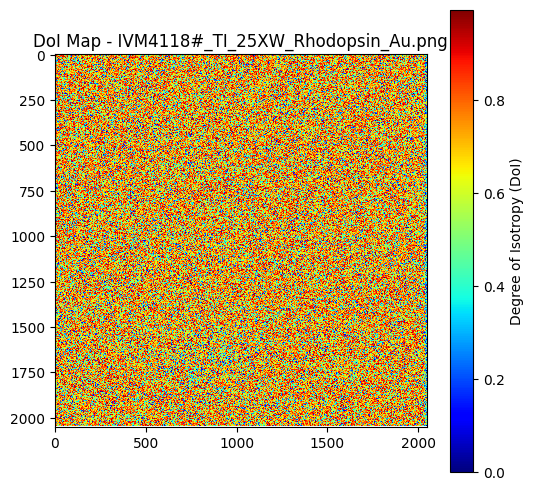

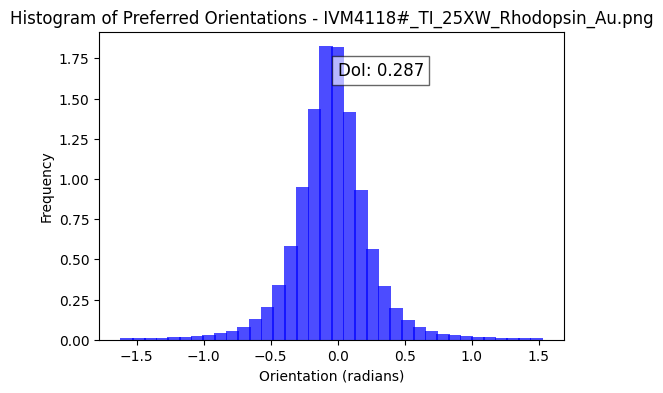


Processing: IVM4119#_TI_25XW_Rhodopsin_Au.png


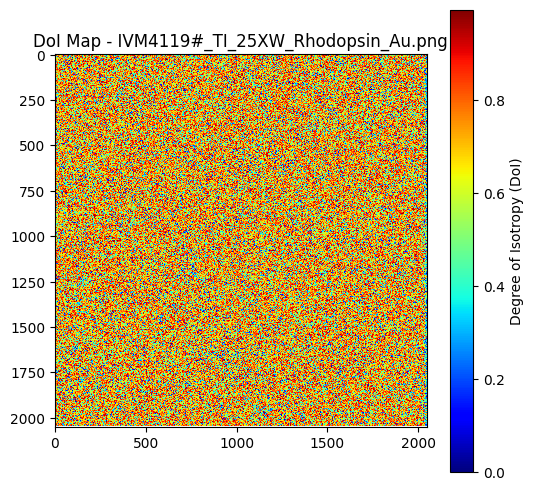

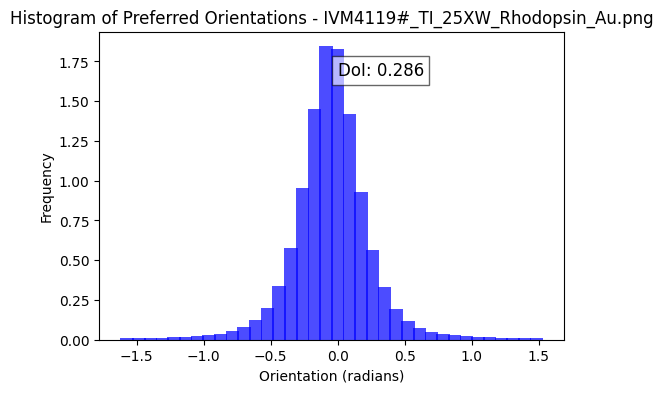


Processing: IVM4120#_TI_25XW_Rhodopsin_Au.png


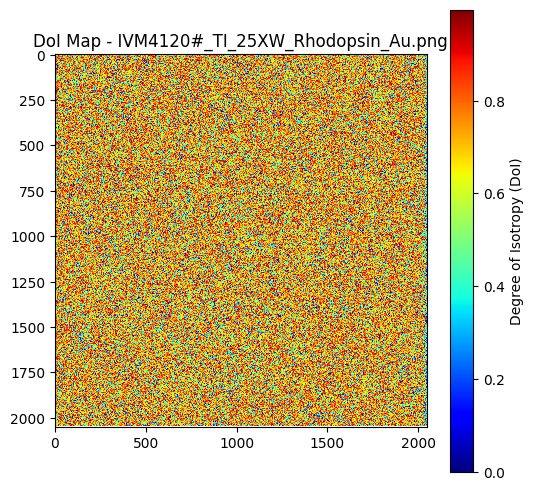

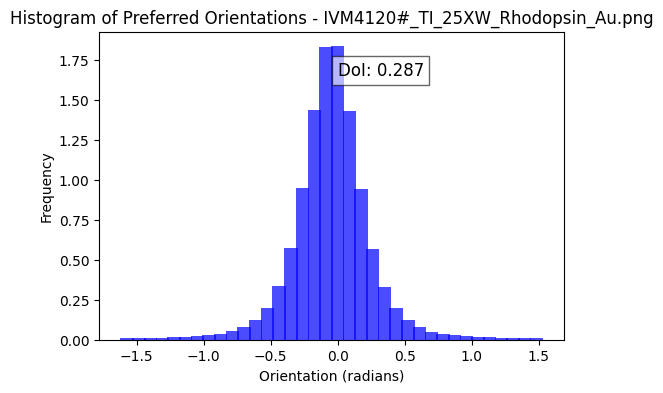

In [3]:
import os

def batch_process_shg_images(folder_path, region_label="Region"):
    results_all = []

    for filename in os.listdir(folder_path):
        if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.tif', '.tiff')):
            image_path = os.path.join(folder_path, filename)
            print(f"\nProcessing: {filename}")
            result = process_shg_image(image_path, region_label=filename)
            if result:
                result["Filename"] = filename
                results_all.append(result)

    return results_all

# Cambia esta ruta por la carpeta donde tengas tus imágenes
folder_path = "C:\\Users\\danwo\\Desktop\\ZS0001_TI_25XW_Rhodopsin_Au"
results_all = batch_process_shg_images(folder_path, region_label="Anterior Stroma")


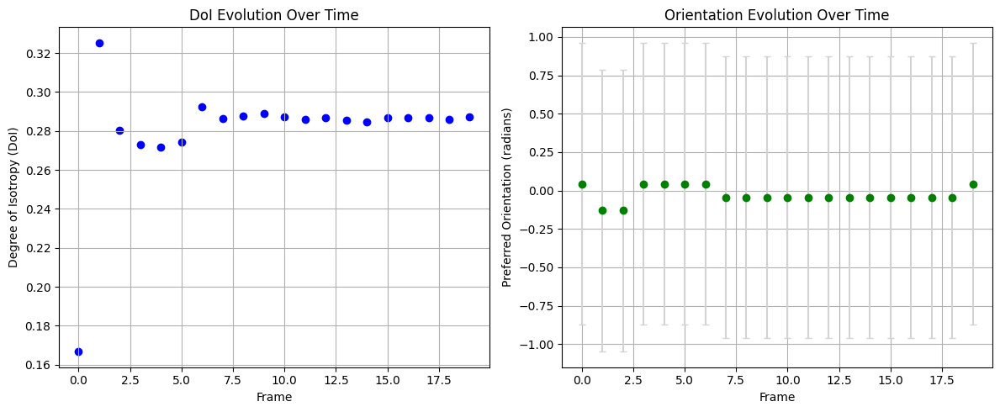

In [4]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.filters import sobel
from scipy.ndimage import gaussian_filter

def load_image(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        raise ValueError(f"Could not load image: {image_path}")
    return img

def compute_orientation_tensor(image):
    sobel_x = sobel(image, axis=0)
    sobel_y = sobel(image, axis=1)

    J11 = gaussian_filter(sobel_x**2, sigma=1)
    J22 = gaussian_filter(sobel_y**2, sigma=1)
    J12 = gaussian_filter(sobel_x * sobel_y, sigma=1)

    theta = 0.5 * np.arctan2(2 * J12, J11 - J22)
    doi_map = np.sqrt(J12**2 + (J11 - J22)**2) / (J11 + J22 + 1e-10)
    return theta, doi_map

def histogram_of_orientations(theta):
    angles = theta.flatten()
    hist, bins = np.histogram(angles, bins=36, range=(-np.pi/2, np.pi/2), density=True)
    return hist, bins

def compute_doi(hist):
    return np.std(hist) / np.max(hist) if np.max(hist) > 0 else 0

def compute_preferred_orientation(hist, bins):
    bin_centers = (bins[:-1] + bins[1:]) / 2
    preferred_angle = bin_centers[np.argmax(hist)]
    uncertainty = np.std(bin_centers, ddof=1)  # Simplified uncertainty
    return preferred_angle, uncertainty

def process_folder(folder_path):
    image_files = sorted([f for f in os.listdir(folder_path) if f.endswith(('.png', '.jpg', '.tif'))])
    dois = []
    orientations = []
    uncertainties = []
    frames = []

    for i, filename in enumerate(image_files):
        path = os.path.join(folder_path, filename)
        img = load_image(path)
        theta, _ = compute_orientation_tensor(img)
        hist, bins = histogram_of_orientations(theta)
        doi = compute_doi(hist)
        pref_ori, uncertainty = compute_preferred_orientation(hist, bins)

        dois.append(doi)
        orientations.append(pref_ori)
        uncertainties.append(uncertainty)
        frames.append(i)

    return frames, dois, orientations, uncertainties

def plot_results(frames, dois, orientations, uncertainties):
    plt.figure(figsize=(12, 5))

    # DoI Scatter Plot
    plt.subplot(1, 2, 1)
    plt.scatter(frames, dois, c='blue', label='DoI')
    plt.xlabel("Frame")
    plt.ylabel("Degree of Isotropy (DoI)")
    plt.title("DoI Evolution Over Time")
    plt.grid(True)

    # Orientation Scatter Plot
    plt.subplot(1, 2, 2)
    plt.errorbar(frames, orientations, yerr=uncertainties, fmt='o', color='green', ecolor='lightgray', capsize=3)
    plt.xlabel("Frame")
    plt.ylabel("Preferred Orientation (radians)")
    plt.title("Orientation Evolution Over Time")
    plt.grid(True)

    plt.tight_layout()
    plt.show()

# Run it
folder_path = "C:\\Users\\danwo\\Desktop\\ZS0001_TI_25XW_Rhodopsin_Au"
frames, dois, orientations, uncertainties = process_folder(folder_path)
plot_results(frames, dois, orientations, uncertainties)


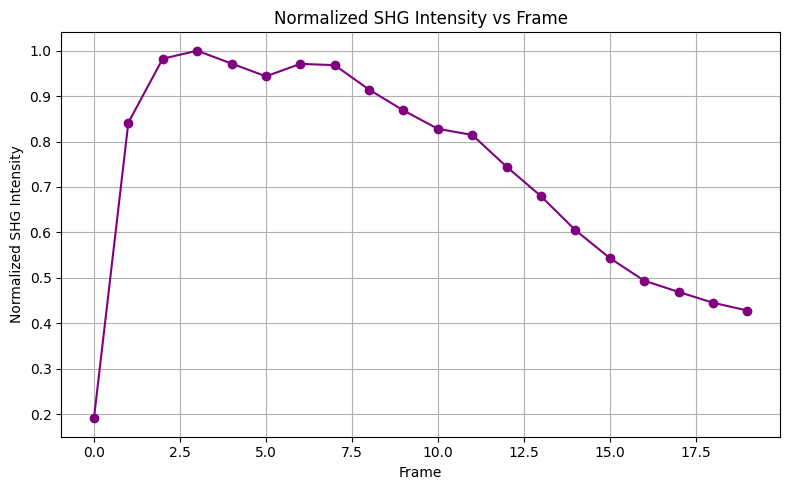

In [5]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

def load_image(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        raise ValueError(f"Could not load image: {image_path}")
    return img

def normalize_image(img):
    norm_img = cv2.normalize(img.astype('float32'), None, 0, 255, cv2.NORM_MINMAX)
    return norm_img.astype(np.uint8)

def process_stack(folder_path, save_normalized=False, save_dir="normalized_images"):
    image_files = sorted([f for f in os.listdir(folder_path) if f.endswith(('.png', '.jpg', '.tif'))])
    intensities = []
    frames = []

    if save_normalized and not os.path.exists(save_dir):
        os.makedirs(save_dir)

    for i, filename in enumerate(image_files):
        path = os.path.join(folder_path, filename)
        img = load_image(path)

        # Normaliza la imagen
        norm_img = normalize_image(img)

        # Guarda si se requiere
        if save_normalized:
            save_path = os.path.join(save_dir, f"normalized_{i:03}.png")
            cv2.imwrite(save_path, norm_img)

        # Calcula intensidad promedio
        mean_intensity = np.mean(img)
        intensities.append(mean_intensity)
        frames.append(i)

    # Normaliza intensidades
    max_intensity = max(intensities)
    normalized_intensities = [i / max_intensity for i in intensities]

    return frames, normalized_intensities

def plot_intensity(frames, normalized_intensities):
    plt.figure(figsize=(8,5))
    plt.plot(frames, normalized_intensities, 'o-', color='purple')
    plt.xlabel("Frame")
    plt.ylabel("Normalized SHG Intensity")
    plt.title("Normalized SHG Intensity vs Frame")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Run
folder_path = "C:\\Users\\danwo\\Desktop\\ZS0001_TI_25XW_Rhodopsin_Au"
frames, norm_intensities = process_stack(folder_path, save_normalized=True)
plot_intensity(frames, norm_intensities)


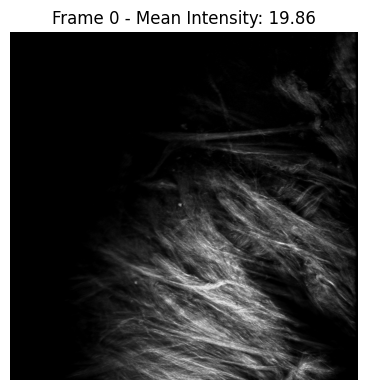

Frame 0: Promedio de intensidad = 19.86


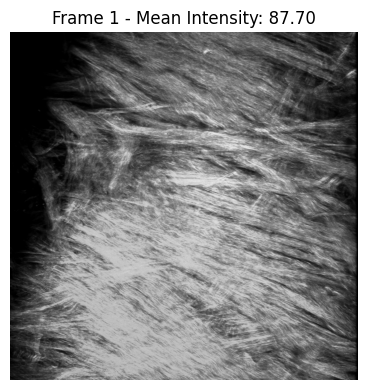

Frame 1: Promedio de intensidad = 87.70


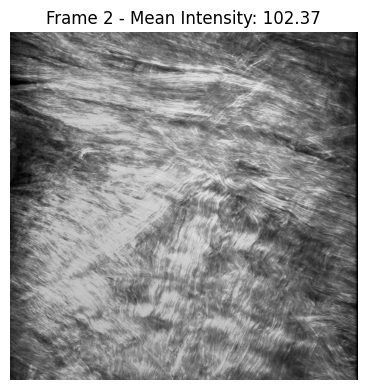

Frame 2: Promedio de intensidad = 102.37


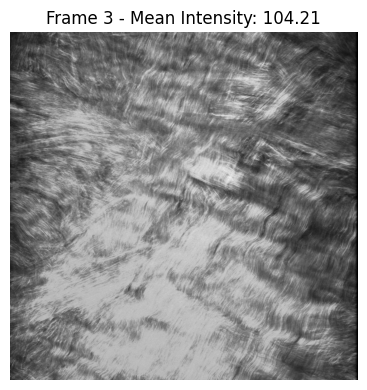

Frame 3: Promedio de intensidad = 104.21


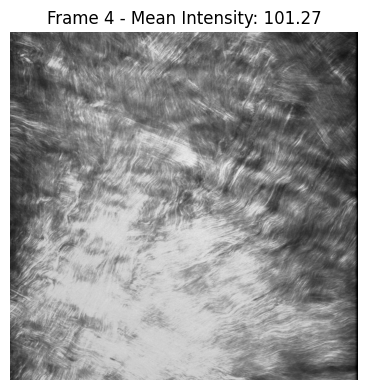

Frame 4: Promedio de intensidad = 101.27


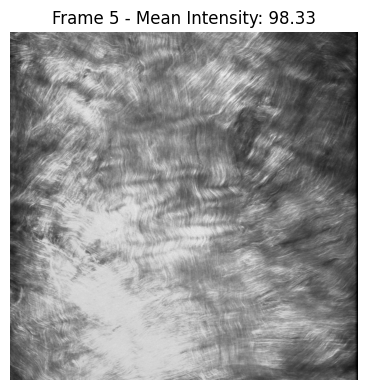

Frame 5: Promedio de intensidad = 98.33


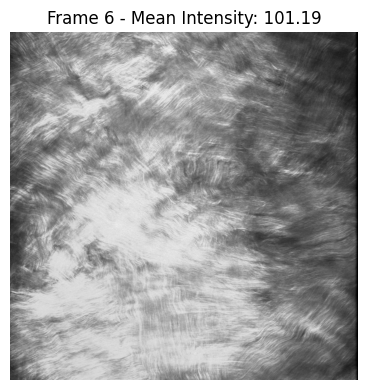

Frame 6: Promedio de intensidad = 101.19


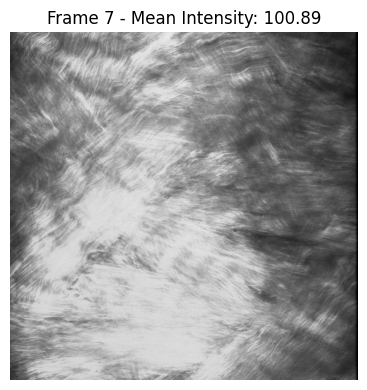

Frame 7: Promedio de intensidad = 100.89


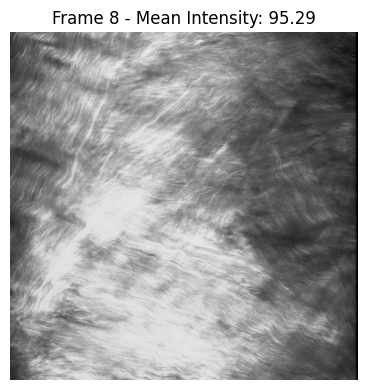

Frame 8: Promedio de intensidad = 95.29


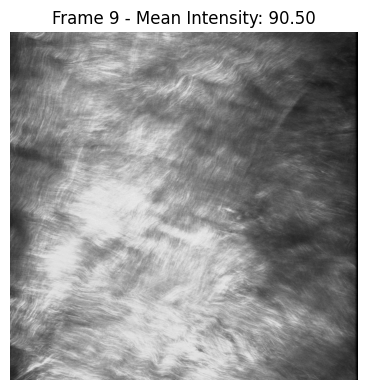

Frame 9: Promedio de intensidad = 90.50


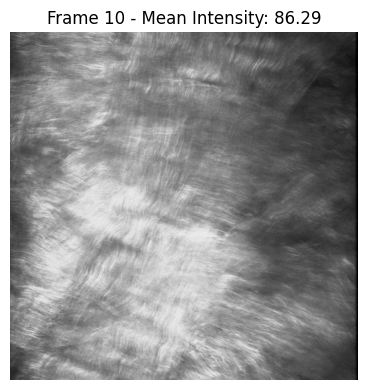

Frame 10: Promedio de intensidad = 86.29


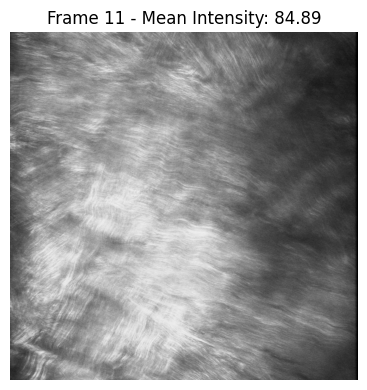

Frame 11: Promedio de intensidad = 84.89


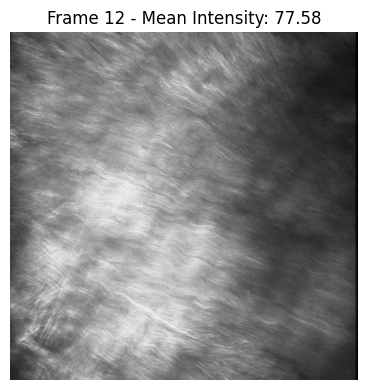

Frame 12: Promedio de intensidad = 77.58


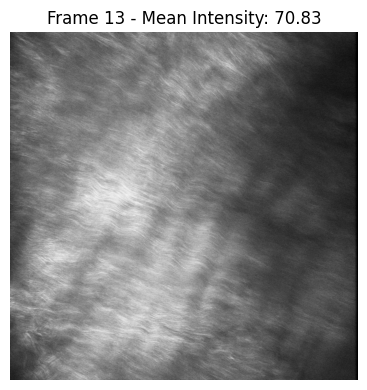

Frame 13: Promedio de intensidad = 70.83


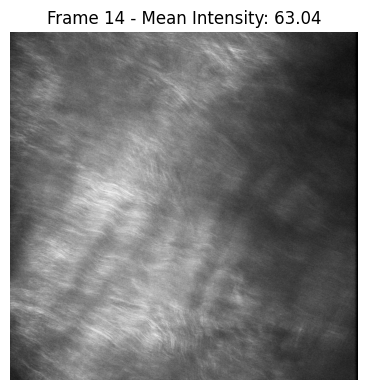

Frame 14: Promedio de intensidad = 63.04


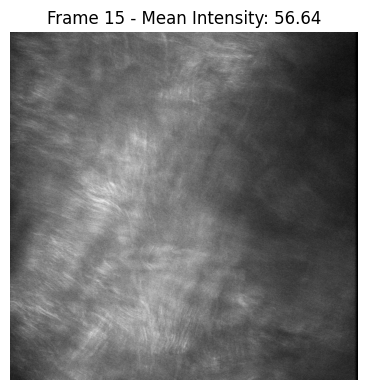

Frame 15: Promedio de intensidad = 56.64


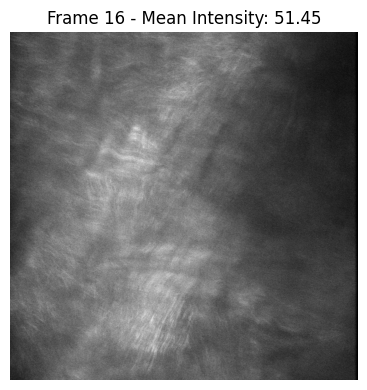

Frame 16: Promedio de intensidad = 51.45


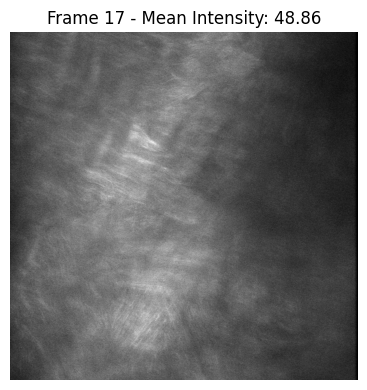

Frame 17: Promedio de intensidad = 48.86


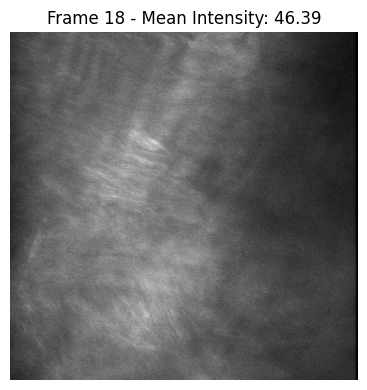

Frame 18: Promedio de intensidad = 46.39


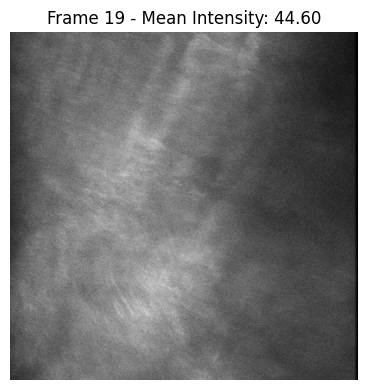

Frame 19: Promedio de intensidad = 44.60


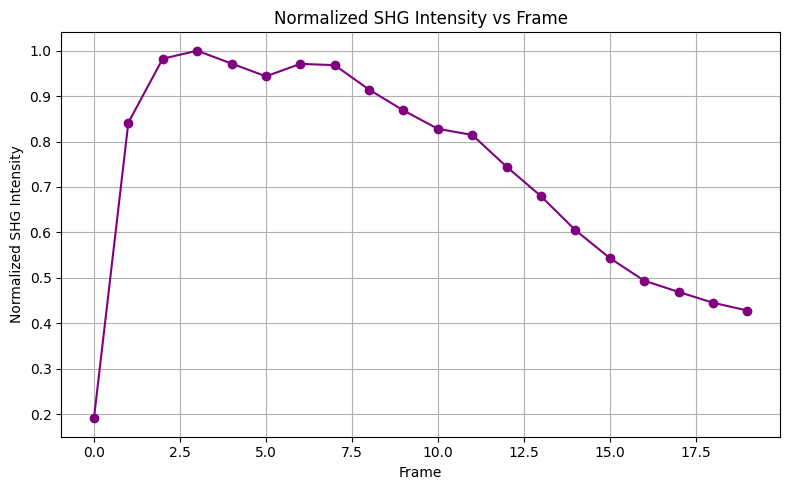

In [6]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

def load_image(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        raise ValueError(f"Could not load image: {image_path}")
    return img

def normalize_image(img):
    norm_img = cv2.normalize(img.astype('float32'), None, 0, 255, cv2.NORM_MINMAX)
    return norm_img.astype(np.uint8)

def process_stack(folder_path, save_normalized=False, save_dir="normalized_images"):
    image_files = sorted([f for f in os.listdir(folder_path) if f.endswith(('.png', '.jpg', '.tif'))])
    intensities = []
    frames = []

    if save_normalized and not os.path.exists(save_dir):
        os.makedirs(save_dir)

    for i, filename in enumerate(image_files):
        path = os.path.join(folder_path, filename)
        img = load_image(path)

        # Normaliza y calcula intensidad
        norm_img = normalize_image(img)
        mean_intensity = np.mean(img)
        intensities.append(mean_intensity)
        frames.append(i)

        # Muestra imagen normalizada y valor de intensidad
        plt.figure(figsize=(4,4))
        plt.imshow(norm_img, cmap='gray')
        plt.title(f'Frame {i} - Mean Intensity: {mean_intensity:.2f}')
        plt.axis('off')
        plt.tight_layout()
        plt.show()

        print(f'Frame {i}: Promedio de intensidad = {mean_intensity:.2f}')

        # Guarda imagen si se indica
        if save_normalized:
            save_path = os.path.join(save_dir, f"normalized_{i:03}.png")
            cv2.imwrite(save_path, norm_img)

    # Normaliza intensidades
    max_intensity = max(intensities)
    normalized_intensities = [i / max_intensity for i in intensities]

    return frames, normalized_intensities

def plot_intensity(frames, normalized_intensities):
    plt.figure(figsize=(8,5))
    plt.plot(frames, normalized_intensities, 'o-', color='purple')
    plt.xlabel("Frame")
    plt.ylabel("Normalized SHG Intensity")
    plt.title("Normalized SHG Intensity vs Frame")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Ruta de las imágenes
folder_path = "C:\\Users\\danwo\\Desktop\\ZS0001_TI_25XW_Rhodopsin_Au"
frames, norm_intensities = process_stack(folder_path, save_normalized=False)
plot_intensity(frames, norm_intensities)


Ahora pretendo representar los dos plots uno que sea el curado y el otro sin curar

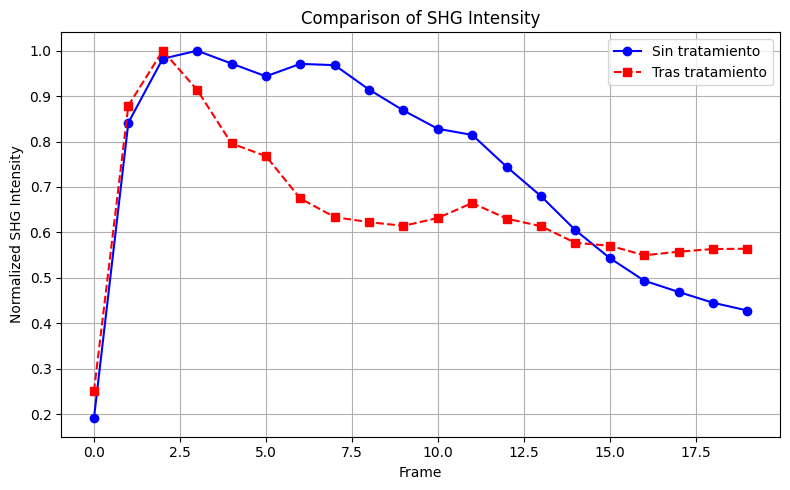

In [7]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

def load_image(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        raise ValueError(f"Could not load image: {image_path}")
    return img

def normalize_image(img):
    norm_img = cv2.normalize(img.astype('float32'), None, 0, 255, cv2.NORM_MINMAX)
    return norm_img.astype(np.uint8)

def process_stack(folder_path):
    image_files = sorted([f for f in os.listdir(folder_path) if f.endswith(('.png', '.jpg', '.tif'))])
    intensities = []

    for filename in image_files:
        path = os.path.join(folder_path, filename)
        img = load_image(path)
        mean_intensity = np.mean(img)
        intensities.append(mean_intensity)

    max_intensity = max(intensities)
    normalized_intensities = [i / max_intensity for i in intensities]
    return list(range(len(normalized_intensities))), normalized_intensities

def plot_two_stacks(folder1, label1, folder2, label2):
    frames1, norm1 = process_stack(folder1)
    frames2, norm2 = process_stack(folder2)

    plt.figure(figsize=(8,5))
    plt.plot(frames1, norm1, 'o-', label=label1, color='blue')
    plt.plot(frames2, norm2, 's--', label=label2, color='red')
    plt.xlabel("Frame")
    plt.ylabel("Normalized SHG Intensity")
    plt.title("Comparison of SHG Intensity")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Carpetas
folder_sin_tratamiento = "C:\\Users\\danwo\\Desktop\\ZS0001_TI_25XW_Rhodopsin_Au"
folder_tras_tratamiento = "C:\\Users\\danwo\\Desktop\\ZS0003_TI_25XW_Sample1_GNP_MB"

plot_two_stacks(folder_sin_tratamiento, "Sin tratamiento", folder_tras_tratamiento, "Tras tratamiento")


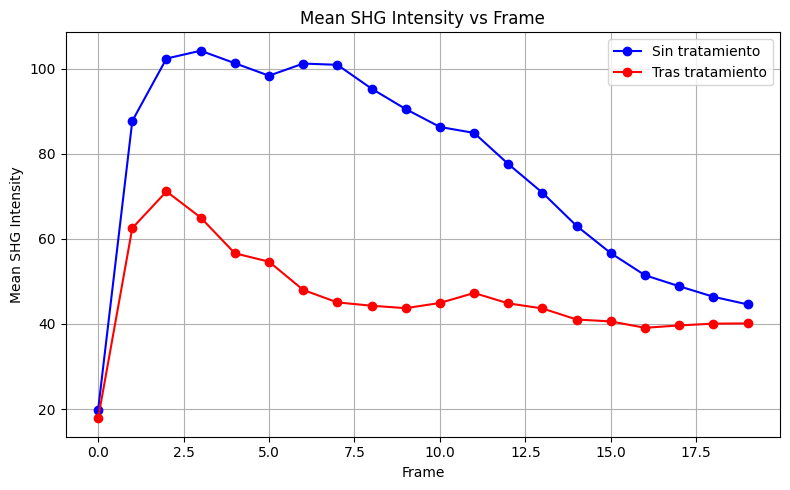

In [8]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

def load_image(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        raise ValueError(f"Could not load image: {image_path}")
    return img

def process_stack(folder_path):
    image_files = sorted([f for f in os.listdir(folder_path) if f.endswith(('.png', '.jpg', '.tif'))])
    intensities = []
    frames = []

    for i, filename in enumerate(image_files):
        path = os.path.join(folder_path, filename)
        img = load_image(path)
        mean_intensity = np.mean(img)
        intensities.append(mean_intensity)
        frames.append(i)

    return frames, intensities

def plot_intensities(folder1_data, folder2_data, label1, label2):
    frames1, intensities1 = folder1_data
    frames2, intensities2 = folder2_data

    plt.figure(figsize=(8,5))
    plt.plot(frames1, intensities1, 'o-', label=label1, color='blue')
    plt.plot(frames2, intensities2, 'o-', label=label2, color='red')
    plt.xlabel("Frame")
    plt.ylabel("Mean SHG Intensity")
    plt.title("Mean SHG Intensity vs Frame")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Paths to your folders
folder_path_untreated = r"C:\\Users\\danwo\Desktop\\ZS0001_TI_25XW_Rhodopsin_Au"
folder_path_treated = r"C:\\Users\\danwo\Desktop\\ZS0003_TI_25XW_Sample1_GNP_MB"

# Process both stacks
untreated_data = process_stack(folder_path_untreated)
treated_data = process_stack(folder_path_treated)

# Plot both in the same graph
plot_intensities(untreated_data, treated_data, "Sin tratamiento", "Tras tratamiento")
